## Working with Navigation Meshes

In [1]:
import sys
import os

# Get the absolute path to the 'awpy' folder
awpy_path = os.path.abspath(os.path.join(os.getcwd(), '..', '..', 'awpy'))

# Add it to sys.path
if awpy_path not in sys.path:
    sys.path.insert(0, awpy_path)

# Confirm it's in the path
#print(sys.path)

**Date Modified: February 19 2025**

Navigation meshes are a data structure which encode information about a space in a 3D world. Typically, they're used for helping bots navigate through that world. Essentially, these navigation meshes are graphs, where a navigable region of the map (a "tile") is connected to others (the edges on the graph).

In CSGO, a navigation mesh comes in the form of a .nav file. In our library, we provide the navigation mesh information for the most popular maps. If a map is missing, feel free to open up a feature request on Github issues. The map data is found in the awpy.data module. The main pieces of data are outlined below. After outlining the data, we show how we can use navigation meshes to calculate distances in CSGO.

### `from awpy.data.map_data import MAP_DATA`

`MAP_DATA` is a JSON which contains information that is used to scale coordinates for visualization. The top-level keys are maps, and the objects contained within have an `pos_x`, `pos_y` and `scale` key. An example looks like:

```json
{
    ...,
    "de_overpass": {
        'pos_x': -4831,
        'pos_y': 1781,
        'scale': 5.2,
        'rotate': 0,
        'zoom': 0,
        'lower_level_max_units': -inf
    },
    ...
}
```

**TODO**: Mention `rotation`, `zoom`, and `lower_level_max_units` keys

### Basic Nav Mesh Functionality in awpy

#### Show Nav Mesh JSON format

In [2]:
from awpy import Nav

In [3]:
dust_2_nav = Nav(path="../../awpy/data/de_dust2")
dust_2_nav

Nav(version=35.1, areas=2248)

Nav object contains two attributes - version and areas. Version states the version of the nav mesh file used. Areas is a dictionary where the key is a NavArea id and the value is the NavArea object. All of the NavArea objects for a given map together describe the navigable surfaces for that map. More details on the NavArea object can be seen in awpy.nav.

In [4]:
dust_2_nav.areas[832]

NavArea(id=832, connected_ids=[747, 828, 876, 919, 941, 975], points=[(1618.9998779296875, 710.9998168945312, 84.00000762939453), (1589.0, 710.9998168945312, 84.00000762939453), (1589.0, 343.499755859375, 84.00000762939453), (1618.9998779296875, 343.499755859375, 84.00000762939453)], size=11024.956970207393)

#### Visualize all Nav Meshes on de_dust2 png

In [5]:
from awpy.plot import tile_viz_utils

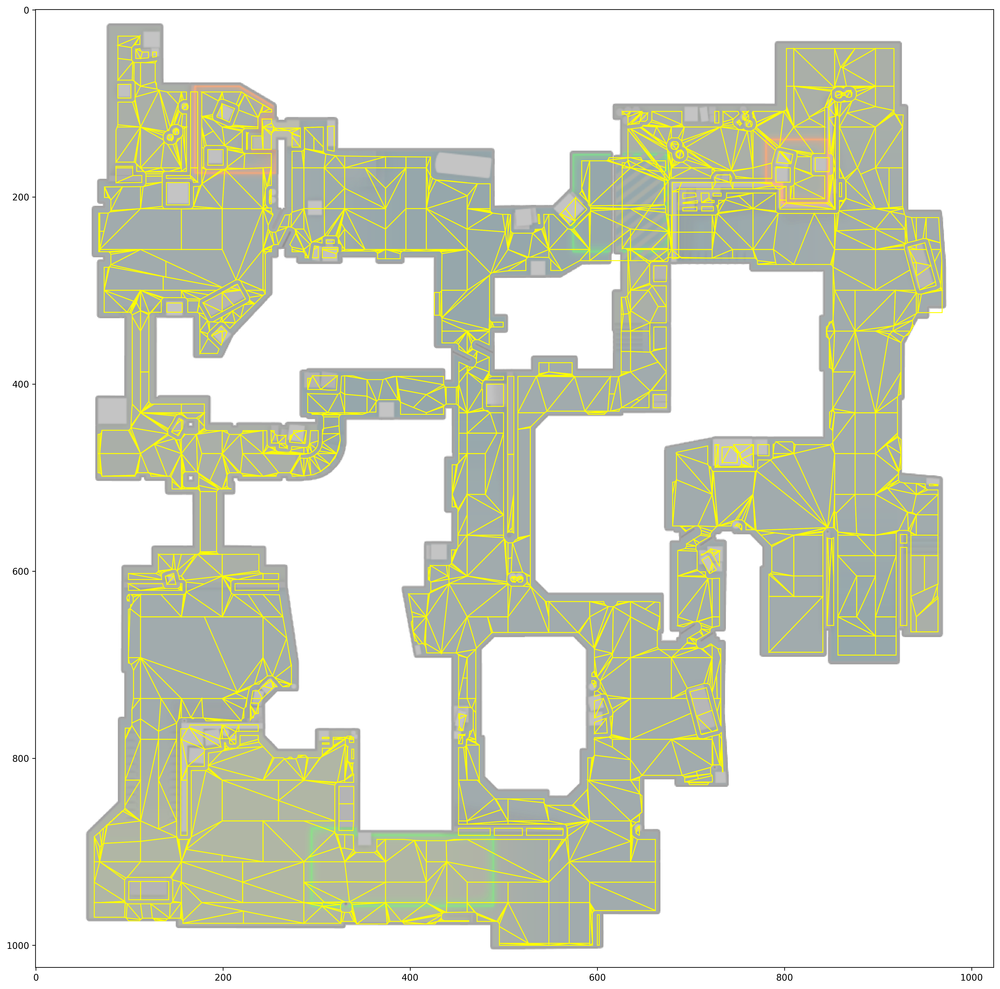

In [6]:
tile_viz_utils.plot_map_tiles("", "de_dust2")

#### Visualize indivdual nav meshes on de_dust2 png

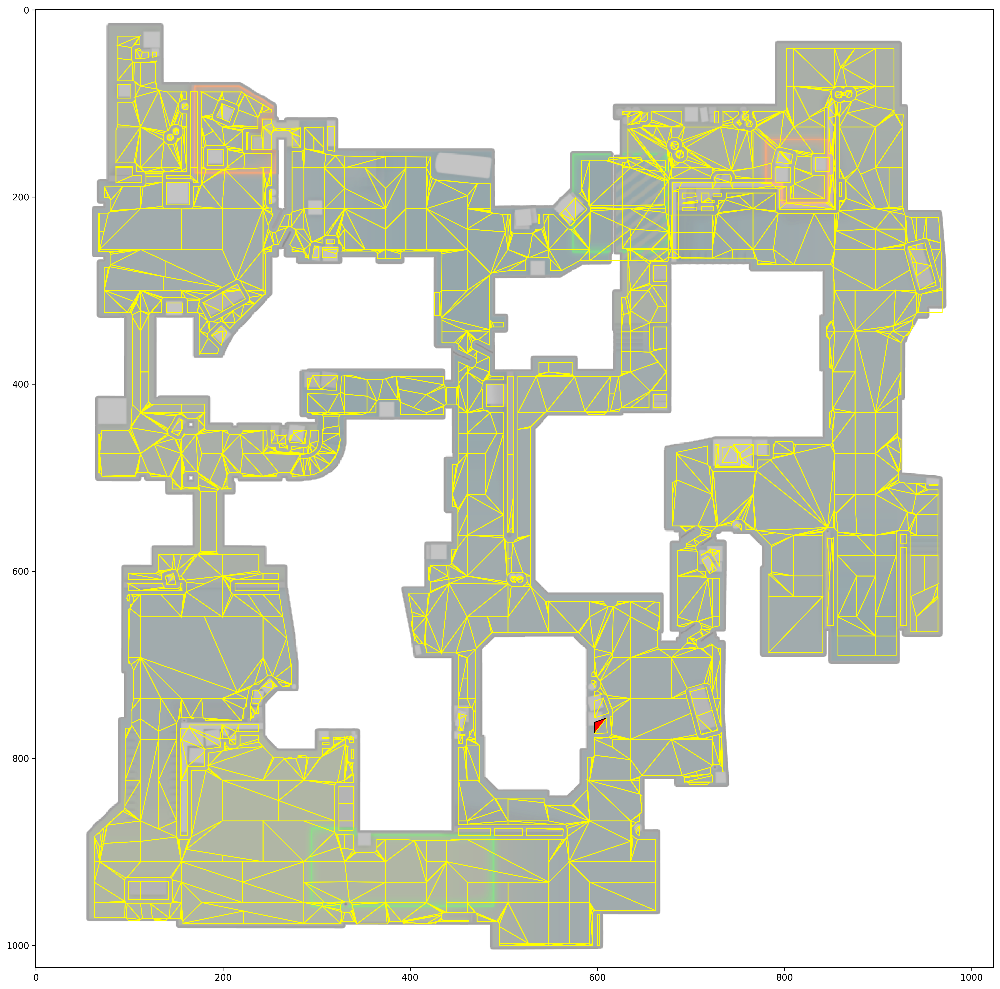

In [10]:
'''
In the following cells we will visualize two nav mesh tiles (14 and 832) 
specifically in the graphic.
'''

tile_viz_utils.plot_map_tiles_selected("", "de_dust2", [14])

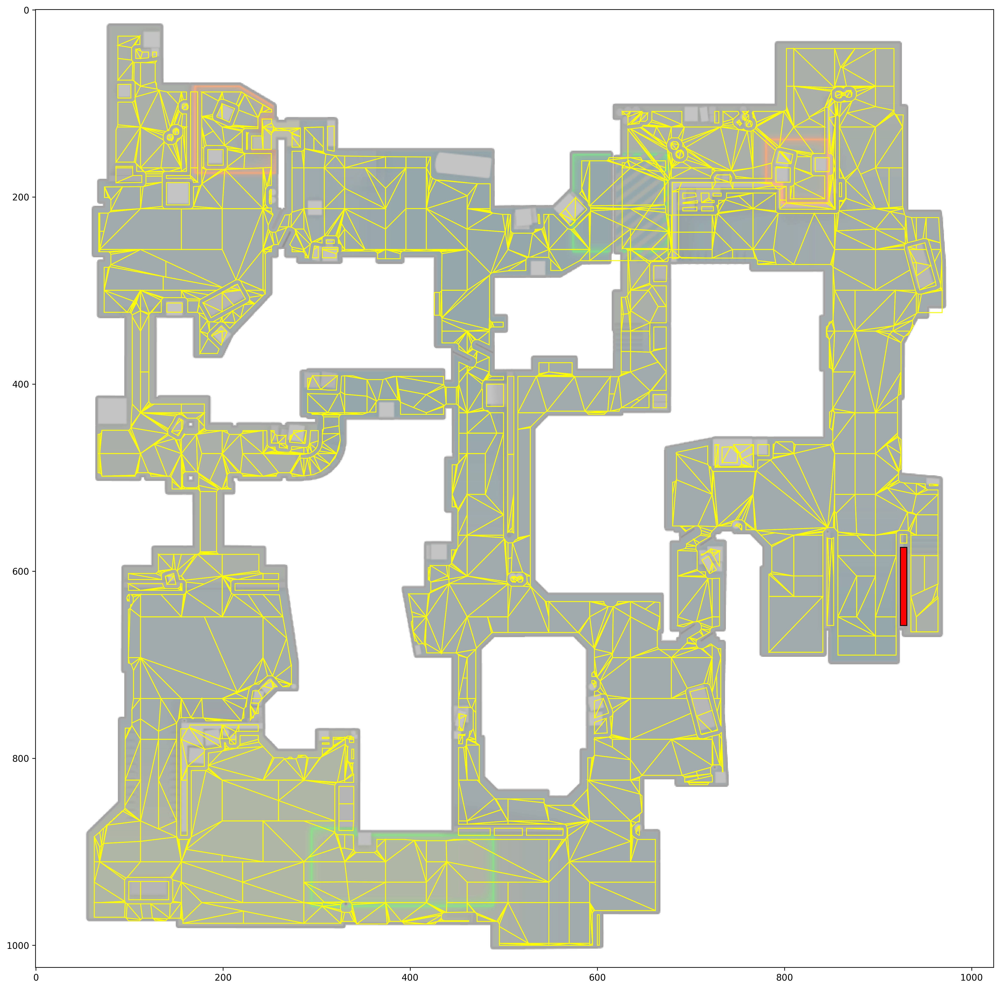

In [11]:
tile_viz_utils.plot_map_tiles_selected("", "de_dust2", [832])

#### Find path between nav tiles and visualize path

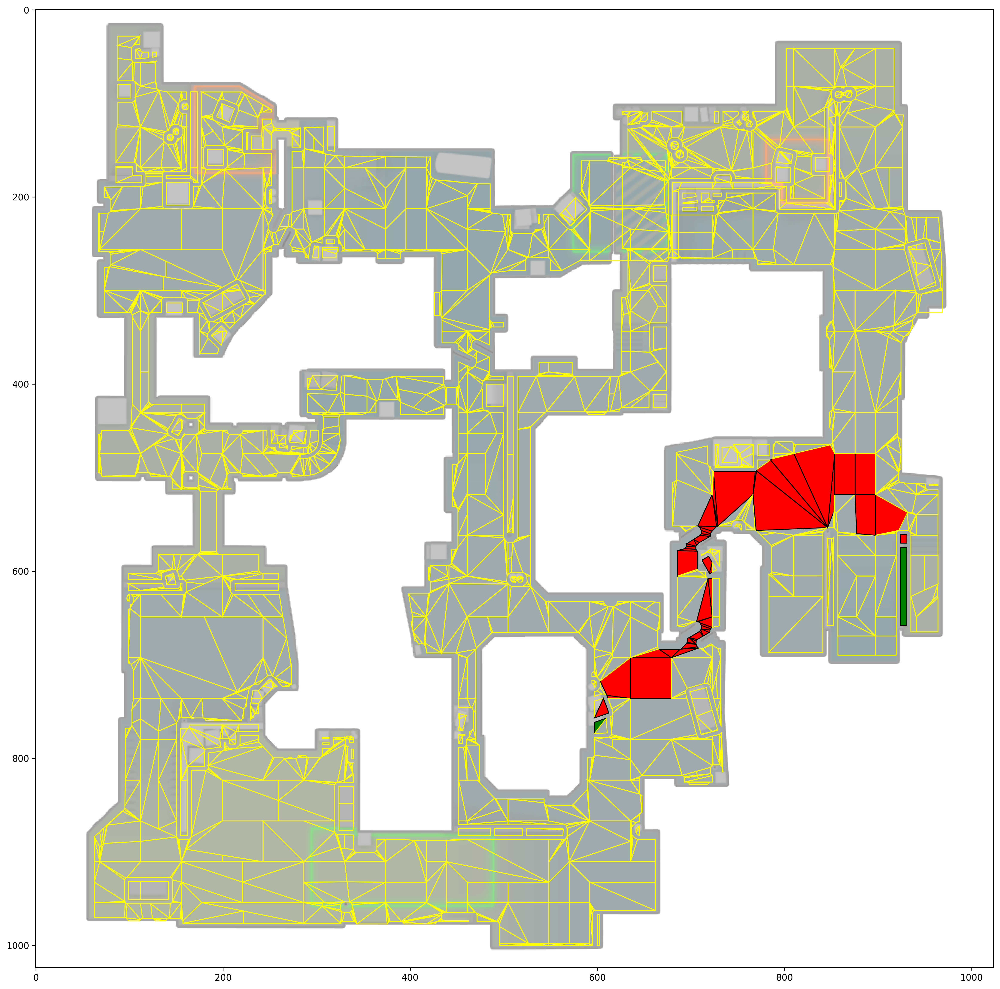

In [9]:
'''
Here we will find the path between two tiles on de_dust2: 14 and 832. Each tile will be colored
in green with black edges while all other tiles in the path will be colored in red with black edges.
'''

tile_path = dust_2_nav.find_path(14, 832)
tile_viz_utils.plot_map_tiles_selected("", "de_dust2", [tile.area_id for tile in tile_path])